 # Used cars price prediction analysis



- This dataset contains information about various used cars, including their features and prices, which we aim to analyze to understand the factors influencing car pricing.

- The dataset includes various attributes of used cars such as price, mileage, year of manufacture, engine size, and categorical variables like make and model. 

- Our goal is to build a predictive model that can estimate car prices based on these features.

- Understanding how different factors affect car prices can help dealerships set competitive prices, assist buyers in making informed decisions, and provide insights into market trends.

- Data preprocessing steps; how we handled categorical variables, our modeling approach using linear regression, and finally, we'll discuss the results and insights gained from our analysis."

In [2]:
# configure notebook
import string
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None

import plotly.express as px
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12.0, 6.0) #keeps all graphs at a stand size of 12 x 6
import seaborn as sns

from scipy import stats
import statsmodels.formula.api as smf

from sklearn import model_selection, metrics, linear_model, datasets, feature_selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [3]:
# import dataset and view info
cars = pd.read_csv('./ca-dealers-used.csv', index_col=0)
cars

C:\Users\aadi1\AppData\Local\Temp\ipykernel_10768\1798887510.py:2: DtypeWarning: Columns (13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  cars = pd.read_csv('./ca-dealers-used.csv', index_col=0)


,vin,price,miles,stock_no,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,seller_name,street,city,state,zip
id,,,,,,,,,,,,,,,,,,,,
b39ea795-eca9,19UNC1B01HY800062,179999.0,9966.0,V-P4139,2017.0,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,edmundston honda,475 Rue Victoria,Edmundston,NB,E3V 2K7
026cb5b1-6e3e,19UNC1B02HY800023,179995.0,5988.0,PPAP70374,2017.0,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,garage daniel lessard,2795 Route-du-prsident-kennedy,Notre-dame-des-pins,QC,G0M 1K0
5cd5d5b2-5cc2,19UNC1B02HY800071,168528.0,24242.0,B21085,2017.0,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,lougheed acura,1388 Lougheed Highway,Coquitlam,BC,V3K 6S4
b32473ed-5922,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,drive autogroup,1305 Parkway Suite 600,Pickering,ON,L1V 3P2
ac40c9fc-0676,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,acura pickering,575 Kingston Road,Pickering,ON,L1V 3N7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f71c5738-33d8,WDC0G5EB8KF614677,47995.0,22108.0,M0684,2019.0,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,2.0,I,mercedes-benz granby,1225 Rue Principale,Granby,QC,J2J 0M3
873d76f0-18d2,WDC0G5EB9JF465808,42995.0,55316.0,D13339,2018.0,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,2.0,I,groupe park avenue - regroupement automobile,8840 Boulevard Taschereau,Brossard,QC,J4X 1C2
7ead9dba-6cdd,WDC0G5EB9JF465808,42995.0,55316.0,D13339,2018.0,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,2.0,I,le mga centre park avenue la prairie,150-b Boulevard Taschereau,La Prairie,QC,J5R 1S8


In [4]:
# view head of dataframe
cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 393603 entries, b39ea795-eca9 to 479607ed-62af
Data columns (total 20 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   vin           393603 non-null  object 
 1   price         358486 non-null  float64
 2   miles         366590 non-null  float64
 3   stock_no      365910 non-null  object 
 4   year          393586 non-null  float64
 5   make          393603 non-null  object 
 6   model         388809 non-null  object 
 7   trim          354824 non-null  object 
 8   body_type     359578 non-null  object 
 9   vehicle_type  355365 non-null  object 
 10  drivetrain    354608 non-null  object 
 11  transmission  357922 non-null  object 
 12  fuel_type     322790 non-null  object 
 13  engine_size   320950 non-null  float64
 14  engine_block  320439 non-null  object 
 15  seller_name   391371 non-null  object 
 16  street        385674 non-null  object 
 17  city          385829 non-null  obj

---

# Data Cleaning & Preprocessing

## Formatting

### Overall

In [8]:
# create copy to assign changes to
f_cars = cars.copy()

# drop irrelevant columns
f_cars.drop(columns=['stock_no', 'seller_name', 'street', 'city', 'zip'], inplace=True)

# rename state col 
f_cars.rename(columns={'state': 'province'}, inplace=True)

# view 'object' dtype columns
f_cars.select_dtypes('object')

,vin,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_block,province
id,,,,,,,,,,,
b39ea795-eca9,19UNC1B01HY800062,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,V,NB
026cb5b1-6e3e,19UNC1B02HY800023,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,V,QC
5cd5d5b2-5cc2,19UNC1B02HY800071,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,V,BC
b32473ed-5922,19UNC1B02LY800001,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,V,ON
ac40c9fc-0676,19UNC1B02LY800001,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,V,ON
...,...,...,...,...,...,...,...,...,...,...,...
f71c5738-33d8,WDC0G5EB8KF614677,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,I,QC
873d76f0-18d2,WDC0G5EB9JF465808,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,I,QC
7ead9dba-6cdd,WDC0G5EB9JF465808,Mercedes-Benz,GLC-Class,GLC350e,SUV,Truck,4WD,Automatic,Electric / Unleaded,I,QC


In [9]:
# create list of 'object' dtype columns
oc = list(f_cars.select_dtypes('object'))

# loop through to convert columns to string dtype
for c in oc:
    f_cars[c] = f_cars[c].astype('string')
    
# recheck dataframe info
f_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 393603 entries, b39ea795-eca9 to 479607ed-62af
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   vin           393603 non-null  string 
 1   price         358486 non-null  float64
 2   miles         366590 non-null  float64
 3   year          393586 non-null  float64
 4   make          393603 non-null  string 
 5   model         388809 non-null  string 
 6   trim          354824 non-null  string 
 7   body_type     359578 non-null  string 
 8   vehicle_type  355365 non-null  string 
 9   drivetrain    354608 non-null  string 
 10  transmission  357922 non-null  string 
 11  fuel_type     322790 non-null  string 
 12  engine_size   320950 non-null  float64
 13  engine_block  320439 non-null  string 
 14  province      385767 non-null  string 
dtypes: float64(4), string(11)
memory usage: 48.0+ MB


In [10]:
# Converting object data type to String to format/ clean

In [11]:
# loop through to trim whitespace in string columns
for c in oc:
    f_cars[c] = f_cars[c].str.strip()

### Categorical Columns

In [13]:
# get number of unique values for each column
f_cars.nunique()

vin             226691
price            27979
miles           111859
year                42
make                57
model              955
trim              1607
body_type           21
vehicle_type         2
drivetrain           3
transmission         2
fuel_type           26
engine_size         66
engine_block         3
province            16
dtype: int64

In [14]:
# create lists of all columns and those with fewer than 25 unique values
cols = list(f_cars)
cat = [c for c in cols if f_cars[c].nunique() <25]

# loop through convert to category dtype
for c in cat:
    f_cars[c] = f_cars[c].astype('category')

# re-check dataframe info
f_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 393603 entries, b39ea795-eca9 to 479607ed-62af
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   vin           393603 non-null  string  
 1   price         358486 non-null  float64 
 2   miles         366590 non-null  float64 
 3   year          393586 non-null  float64 
 4   make          393603 non-null  string  
 5   model         388809 non-null  string  
 6   trim          354824 non-null  string  
 7   body_type     359578 non-null  category
 8   vehicle_type  355365 non-null  category
 9   drivetrain    354608 non-null  category
 10  transmission  357922 non-null  category
 11  fuel_type     322790 non-null  string  
 12  engine_size   320950 non-null  float64 
 13  engine_block  320439 non-null  category
 14  province      385767 non-null  category
dtypes: category(6), float64(4), string(5)
memory usage: 32.3+ MB


### VIN Column

In [16]:
# check that all values have 17 characters
f_cars.loc[f_cars['vin'].str.len()!=17]

# ensure all alpha characters are uppercase
f_cars['vin'].str.upper()
f_cars['vin'] = f_cars['vin'].str.upper()

# remove non alphanumeric characters
f_cars['vin'].str.replace(r'[^a-zA-Z0-9]','',regex=True)
f_cars['vin'] = f_cars['vin'].str.replace(r'[^a-zA-Z0-9]','',regex=True)

### Year Column

In [18]:
# convert to string dtype
f_cars['year'] = f_cars['year'].astype('string')

# remove extra characters from year col
f_cars['year'].str.replace('.0', '')
f_cars['year'] = f_cars['year'].str.replace('.0', '')

f_cars.head()

,vin,price,miles,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province
id,,,,,,,,,,,,,,,
b39ea795-eca9,19UNC1B01HY800062,179999.0,9966.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,NB
026cb5b1-6e3e,19UNC1B02HY800023,179995.0,5988.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,QC
5cd5d5b2-5cc2,19UNC1B02HY800071,168528.0,24242.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,BC
b32473ed-5922,19UNC1B02LY800001,220000.0,6637.0,2020,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,ON
ac40c9fc-0676,19UNC1B02LY800001,220000.0,6637.0,2020,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,ON


### Mileage

In [20]:
# create column to convert to km
f_cars['km'] = f_cars['miles']*1.6

# drop miles column
f_cars.drop(columns=['miles'], inplace=True)
f_cars.head()

,vin,price,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province,km
id,,,,,,,,,,,,,,,
b39ea795-eca9,19UNC1B01HY800062,179999.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,NB,15945.6
026cb5b1-6e3e,19UNC1B02HY800023,179995.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,QC,9580.8
5cd5d5b2-5cc2,19UNC1B02HY800071,168528.0,2017,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,BC,38787.2
b32473ed-5922,19UNC1B02LY800001,220000.0,2020,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,ON,10619.2
ac40c9fc-0676,19UNC1B02LY800001,220000.0,2020,Acura,NSX,Base,Coupe,Car,4WD,Automatic,Electric / Premium Unleaded,3.5,V,ON,10619.2


### Fuel Type Column

In [22]:
# view unique values in fuel type column
f_cars['fuel_type'].sort_values().unique()
u_fuel = f_cars['fuel_type'].sort_values().unique()
print(len(u_fuel))

for x in u_fuel:
    print(x)

27
Biodiesel
Compressed Natural Gas
Compressed Natural Gas / Lpg
Compressed Natural Gas / Unleaded
Compressed Natural Gas; Unleaded
Diesel
Diesel / Premium Unleaded
E85
E85 / Premium Unleaded
E85 / Unleaded
E85 / Unleaded; Unleaded
E85 / Unleaded; Unleaded / Unleaded
Electric
Electric / E85
Electric / Hydrogen
Electric / Premium Unleaded
Electric / Unleaded
Premium Unleaded
Premium Unleaded / Natural Gas
Premium Unleaded / Unleaded
Premium Unleaded; Unleaded
Unleaded
Unleaded / E85
Unleaded / Electric
Unleaded / Premium Unleaded
Unleaded / Unleaded
<NA>


In [23]:
# clean data in fuel_type col
# replace values with Diesel, Electric, or Hybrid accordingly
f_cars.loc[f_cars['fuel_type']=='Biodiesel', 'fuel_type']='Diesel'
f_cars.loc[f_cars['fuel_type']=='Electric / Hydrogen', 'fuel_type']='Electric'
f_cars.loc[
    (f_cars['fuel_type']=='Electric / E85') |
    (f_cars['fuel_type']=='Electric / Premium Unleaded') |
    (f_cars['fuel_type']=='Electric / Unleaded') |
    (f_cars['fuel_type']=='Unleaded / Electric'),
    'fuel_type']='Hybrid'

# replace other values with Gas
f_cars.loc[
    (f_cars['fuel_type'].notna()) &
    (f_cars['fuel_type']!='Diesel') &
    (f_cars['fuel_type']!='Electric') &
    (f_cars['fuel_type']!='Hybrid'),
    'fuel_type']='Gas'

# recheck # of unique values in fuel_type col of df
print(f_cars['fuel_type'].sort_values().nunique())
for x in f_cars['fuel_type'].sort_values().unique():
    print(x)

4
Diesel
Electric
Gas
Hybrid
<NA>


In [24]:
# convert column to categorical dtype
f_cars['fuel_type'] = f_cars['fuel_type'].astype('category')

f_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 393603 entries, b39ea795-eca9 to 479607ed-62af
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   vin           393603 non-null  string  
 1   price         358486 non-null  float64 
 2   year          393586 non-null  string  
 3   make          393603 non-null  string  
 4   model         388809 non-null  string  
 5   trim          354824 non-null  string  
 6   body_type     359578 non-null  category
 7   vehicle_type  355365 non-null  category
 8   drivetrain    354608 non-null  category
 9   transmission  357922 non-null  category
 10  fuel_type     322790 non-null  category
 11  engine_size   320950 non-null  float64 
 12  engine_block  320439 non-null  category
 13  province      385767 non-null  category
 14  km            366590 non-null  float64 
dtypes: category(7), float64(3), string(5)
memory usage: 29.7+ MB


## Missing & Duplicated Data

### All Duplicates

In [27]:
# make copy
d_cars = f_cars.copy()

In [28]:
# sort dataframe & view duplicated records
d_cars = d_cars.sort_values(by=['vin','make','price','year','model','province','km','body_type'])
d_cars[d_cars.duplicated()]

,vin,price,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province,km
id,,,,,,,,,,,,,,,
eea7c122-fa0f,1111DXL98MH541615,114506.0,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
0e5b1910-f9d0,1111DXL98MH541615,NaN,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
18cee3ce-c6cb,1111DXL98MH541615,NaN,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
98c13904-8d27,137FA90312E199705,NaN,2002,Am General,Hummer,Base,SUV,Truck,4WD,Automatic,Diesel,6.5,V,QC,106520.0
d5c3f875-3e89,137ZA9039WE180452,100995.0,1998,Hummer,H1,Diesel,<NA>,<NA>,4WD,Automatic,<NA>,NaN,<NA>,QC,202052.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0c64fae8-e2b2,ZN661ZUA3KX324079,114899.0,2019,Maserati,Levante,GTS,SUV,Truck,4WD,Automatic,Gas,3.8,V,QC,17929.6
e2f8ebe1-4ff6,ZN661ZUA3KX324079,114899.0,2019,Maserati,Levante,GTS,SUV,Truck,4WD,Automatic,Gas,3.8,V,QC,17929.6
831379bd-8922,ZN661ZUA5KX332877,159990.0,2019,Maserati,Levante,Trofeo,SUV,Truck,4WD,Automatic,Gas,3.8,V,ON,31808.0


### Re-Listed Cars

In [30]:
# vs duplicated rows w/ subset of vin, price, and km (same listing)
d_cars[d_cars.duplicated(subset=['vin','price','km'])]

,vin,price,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province,km
id,,,,,,,,,,,,,,,
eea7c122-fa0f,1111DXL98MH541615,114506.0,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
0e5b1910-f9d0,1111DXL98MH541615,NaN,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
18cee3ce-c6cb,1111DXL98MH541615,NaN,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
98c13904-8d27,137FA90312E199705,NaN,2002,Am General,Hummer,Base,SUV,Truck,4WD,Automatic,Diesel,6.5,V,QC,106520.0
d5c3f875-3e89,137ZA9039WE180452,100995.0,1998,Hummer,H1,Diesel,<NA>,<NA>,4WD,Automatic,<NA>,NaN,<NA>,QC,202052.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0c64fae8-e2b2,ZN661ZUA3KX324079,114899.0,2019,Maserati,Levante,GTS,SUV,Truck,4WD,Automatic,Gas,3.8,V,QC,17929.6
e2f8ebe1-4ff6,ZN661ZUA3KX324079,114899.0,2019,Maserati,Levante,GTS,SUV,Truck,4WD,Automatic,Gas,3.8,V,QC,17929.6
831379bd-8922,ZN661ZUA5KX332877,159990.0,2019,Maserati,Levante,Trofeo,SUV,Truck,4WD,Automatic,Gas,3.8,V,ON,31808.0


In [31]:
# drop duplicates
d_cars = d_cars.drop_duplicates(subset=['vin','price','km'])
# percent of data left from original dataset after dropping duplicates
print((len(d_cars)/len(cars))*100) 
d_cars.head()

62.511718660680934


,vin,price,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province,km
id,,,,,,,,,,,,,,,
2e252849-e8d1,11111111111111111,NaN,2001,Honda,GTO,4X4,Sedan,Truck,FWD,Manual,<NA>,NaN,<NA>,ON,66646.4
d3a5a89f-a213,1111DXL98MH541615,114506.0,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
0378f580-959b,1111DXL98MH541615,NaN,2021,Dodge,Charger,SRT Hellcat,Sedan,<NA>,RWD,Automatic,<NA>,NaN,<NA>,ON,17.6
49b40541-0452,137FA90301E195563,NaN,2001,Am General,Hummer,Base,SUV,Truck,4WD,Automatic,Diesel,6.5,V,BC,61600.0
4aa6243d-de28,137FA90312E199705,NaN,2002,Am General,Hummer,Base,SUV,Truck,4WD,Automatic,Diesel,6.5,V,QC,106520.0


### Missing Data

In [33]:
# make copy of dataframe & check info
m_cars = d_cars.copy()
m_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246048 entries, 2e252849-e8d1 to 75485435-0109
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   vin           246048 non-null  string  
 1   price         217481 non-null  float64 
 2   year          246034 non-null  string  
 3   make          246048 non-null  string  
 4   model         242973 non-null  string  
 5   trim          217197 non-null  string  
 6   body_type     223758 non-null  category
 7   vehicle_type  221330 non-null  category
 8   drivetrain    217770 non-null  category
 9   transmission  219440 non-null  category
 10  fuel_type     197192 non-null  category
 11  engine_size   196203 non-null  float64 
 12  engine_block  195770 non-null  category
 13  province      243124 non-null  category
 14  km            229294 non-null  float64 
dtypes: category(7), float64(3), string(5)
memory usage: 18.5+ MB


In [34]:
# explore options for dropping null values w/ threshold
m_cars.dropna(thresh=6).sort_values('price')
print(len(m_cars.dropna(thresh=6)))
m_cars.dropna(thresh=8).sort_values('price')
print(len(m_cars.dropna(thresh=8)))
m_cars.dropna(thresh=10).sort_values('price')
print(len(m_cars.dropna(thresh=10)))

## all options above leave +++ records with null values for price...
# create new dataframe with all records having 10+ non-null values
m_ten = m_cars.dropna(thresh=10)
# drop records w/ null price 
m_ten[m_ten['price'].notna()]
print(len(m_ten[m_ten['price'].notna()]))

245983
243868
210060
188473


In [35]:
# explore more options for dropping null values -- 
# drop records w/ no price value
m_cars.dropna(subset=['price']).sort_values('km')
print(len(m_cars.dropna(subset=['price'])))
m_price = m_cars.dropna(subset=['price'])

# threshold AFTER dropping records w/ no price
m_price.dropna(thresh=6)
print(len(m_price.dropna(thresh=6)))
m_price.dropna(thresh=8)
print(len(m_price.dropna(thresh=8)))
# thresh 10 here leaves the same as doing it in the opposite order

217481
217466
216692


In [36]:
# explore more options for dropping null values -- 
# drop records w/ no price AND no km
npm = (m_cars['price'].isna()) & (m_cars['km'].isna())
m_cars[~npm].sort_values('price')
print(len(m_cars[~npm]))

# threshold AFTER dropping records w/ no price AND no mileage
m_cars[~npm].dropna(thresh=6).sort_values('price')
print(len(m_cars[~npm].dropna(thresh=6)))
m_cars[~npm].dropna(thresh=8).sort_values('price')
print(len(m_cars[~npm].dropna(thresh=8)))
m_cars[~npm].dropna(thresh=10).sort_values('price')
print(len(m_cars[~npm].dropna(thresh=10)))

242823
242790
241423
207708


In [37]:
## trying to predict price based on other features, so records w/ no price aren't useful (nor are records with minimal or no feature data)...
m_cars = m_cars.dropna(thresh=10).dropna(subset=['price'])
m_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 188473 entries, d3a5a89f-a213 to 75485435-0109
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   vin           188473 non-null  string  
 1   price         188473 non-null  float64 
 2   year          188473 non-null  string  
 3   make          188473 non-null  string  
 4   model         188352 non-null  string  
 5   trim          188440 non-null  string  
 6   body_type     178558 non-null  category
 7   vehicle_type  176478 non-null  category
 8   drivetrain    188028 non-null  category
 9   transmission  188089 non-null  category
 10  fuel_type     175867 non-null  category
 11  engine_size   174872 non-null  float64 
 12  engine_block  174549 non-null  category
 13  province      186701 non-null  category
 14  km            176852 non-null  float64 
dtypes: category(7), float64(3), string(5)
memory usage: 14.2+ MB


## Outliers

In [39]:
# create function to find outliers using IQR(Interquartile range method)
def find_outliers_IQR(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    
    IQR = q3 - q1
    lower = q1 - (1.5 * IQR)
    upper = q3 + (1.5 * IQR)
    outliers = df[(df < lower) | (df > upper)]
    out_obj = {
        'lower': lower,
        'upper': upper,
        'outliers': outliers
    }
    
    return out_obj

In [40]:
# create copy
o_cars = m_cars.copy()
o_cars.head(2)

# print descriptive statistics
o_cars.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,price,engine_size,km
count,188473.00000,174872.00000,176852.00000
mean,26154.29008,2.76549,122172.90595
std,20837.56552,1.21557,91478.52073
min,0.00000,0.60000,0.00000
25%,14798.00000,2.00000,56563.20000
50%,21986.00000,2.40000,101895.20000
75%,32592.00000,3.50000,169392.40000
max,689995.00000,8.40000,3680052.80000


In [41]:
# view records w/ value of '0.0' in price or km columns
o_cars.loc[(o_cars['price']==0.0) | (o_cars['km']==0.0)]
print(len(o_cars.loc[(o_cars['price']==0.0) | (o_cars['km']==0.0)]))

# drop records w/ price and km value 0.0
o_cars.loc[(o_cars['price']!=0.0) & (o_cars['km']!=0.0)]
o_cars = o_cars.loc[(o_cars['price']!=0.0) & (o_cars['km']!=0.0)]

# print descriptive statistics
o_cars.describe().apply(lambda s: s.apply('{0:.5f}'.format))

656


,price,engine_size,km
count,187817.00000,174246.00000,176196.00000
mean,26111.45092,2.76407,122621.31557
std,20767.08748,1.21404,91342.41672
min,800.00000,0.60000,1.60000
25%,14795.00000,2.00000,57116.80000
50%,21980.00000,2.40000,102356.80000
75%,32499.00000,3.50000,169613.20000
max,689995.00000,8.40000,3680052.80000


### Price

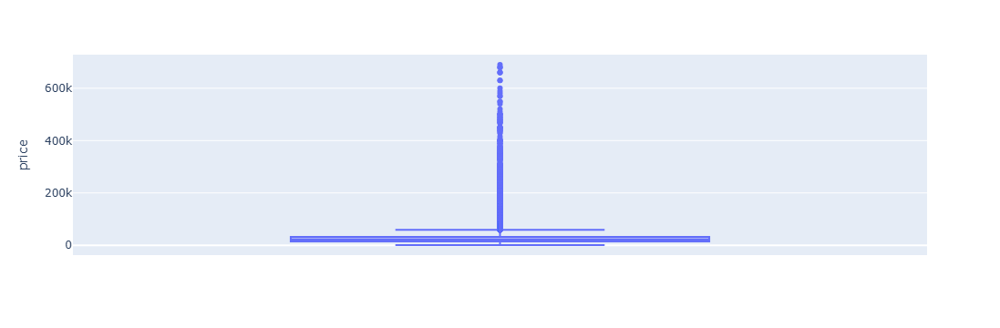

In [43]:
# create box plot -- price
fig = px.box(o_cars, y='price')
fig.show()

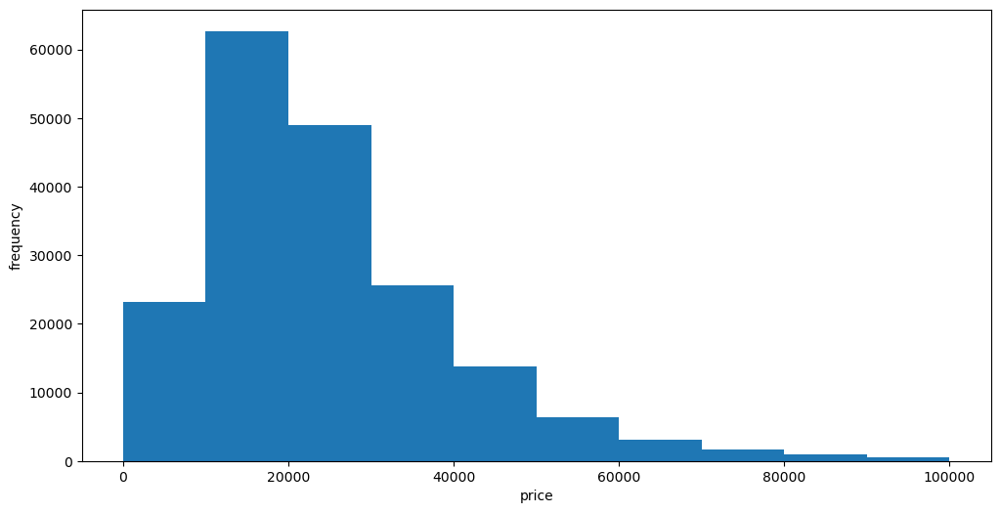

In [44]:
# visualize distribution of price values
plt.figure()
# plt.hist(o_cars['price'])
plt.hist(o_cars['price'], range=(0,100000))
plt.xlabel('price')
plt.ylabel('frequency')
plt.show()

In [45]:
# find outliers -- price
pr_out = find_outliers_IQR(o_cars[['price']])
print('# of price outlier values:', pr_out['outliers'].notna().sum())
print('max price outlier value:', pr_out['outliers'].max())
print('min price outlier value:', pr_out['outliers'].min())
print('upper limit:', pr_out['upper'])

# of price outlier values: price    8056
dtype: int64
max price outlier value: price    689995.0
dtype: float64
min price outlier value: price    59056.0
dtype: float64
upper limit: price    59055.0
dtype: float64


In [46]:
# drop outliers -- price
o_cars.loc[o_cars['price'] <= 59055.0]
o_cars = o_cars.loc[o_cars['price'] <= 59055.0]

o_cars.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,price,engine_size,km
count,179761.00000,166639.00000,168693.00000
mean,23386.23574,2.68603,125923.73945
std,12152.67052,1.13491,91299.91678
min,800.00000,0.60000,1.60000
25%,14298.00000,2.00000,60587.20000
50%,20995.00000,2.40000,105600.00000
75%,30000.00000,3.50000,173684.80000
max,59050.00000,8.30000,3680052.80000


### Kms (mileage)

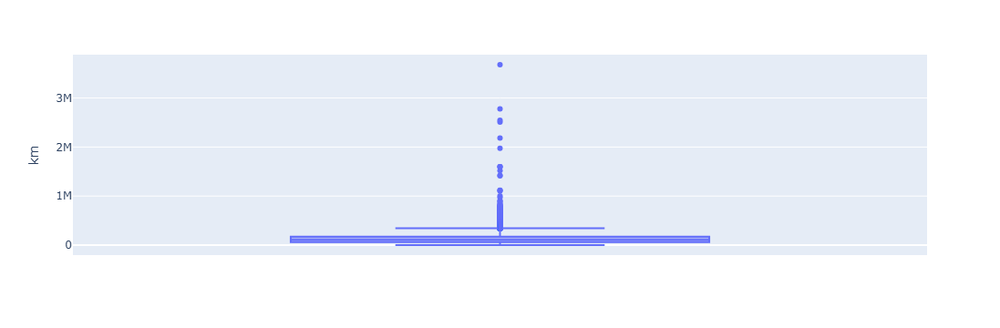

In [48]:
# create box plot -- km
fig = px.box(o_cars, y='km')
fig.show()

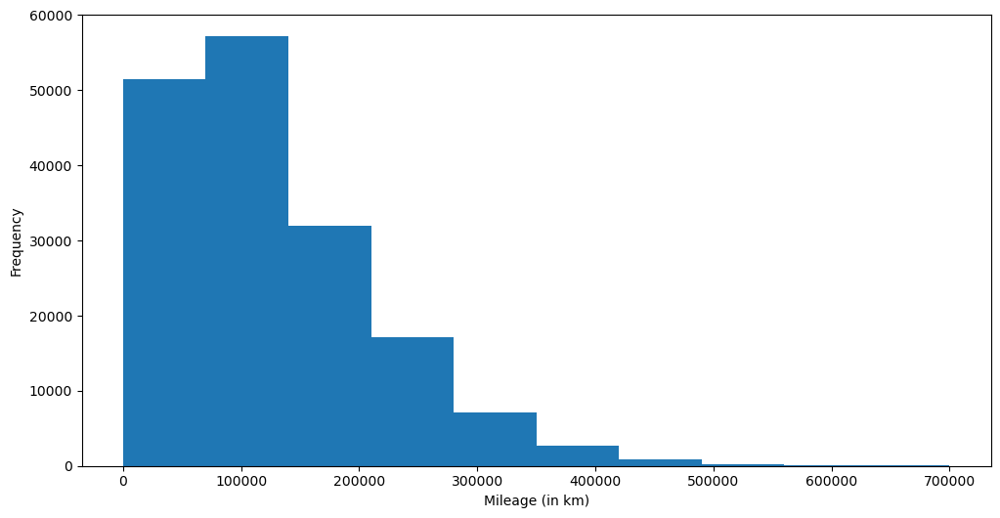

In [49]:
# visualize distribution of all km values
plt.figure()
# plt.hist(o_cars['km'])
plt.hist(o_cars['km'], range=(0,700000))
plt.xlabel('Mileage (in km)')
plt.ylabel('Frequency')
plt.show()

In [50]:
# replace NaN values in km column w/ km mean
o_cars['km'] = o_cars['km'].fillna(value=o_cars['km'].mean())

# find outliers -- km
km_out = find_outliers_IQR(o_cars[['km']])
print('# of km outlier values:', km_out['outliers'].notna().sum())
print('max km outlier value:', km_out['outliers'].max())
print('min km outlier value:', km_out['outliers'].min())
print('upper limit:', km_out['upper'])

# of km outlier values: km    5766
dtype: int64
max km outlier value: km    3680052.8
dtype: float64
min km outlier value: km    323193.6
dtype: float64
upper limit: km    323163.2
dtype: float64


In [51]:
# engineer columns for car age & km per year
o_cars['car_age'] = 2023 - pd.to_numeric(o_cars['year'])
o_cars['km_per_year'] = round(o_cars['km']/o_cars['car_age'],2)

# group by car age, get aggregate stats
gca = o_cars.groupby('car_age')[['price', 'km', 'km_per_year']].agg([len, 'min', 'max', 'mean', 'median'])
gca_km = gca['km']
gca_ykm = gca['km_per_year']
gca_pr = gca['price']

In [52]:
upper = 323163.2
ages = list(gca_km.index)
means = list(gca_km['mean'])

# Replace outlier kms with mean values for the same age
for age, mean in zip(ages, means):
    # Create a mask for cars of the current age
    age_mask = o_cars['car_age'] == age
    
    # Replace km values where km is greater than upper limit
    o_cars.loc[age_mask & (o_cars['km'] > upper), 'km'] = round(mean, 2)

o_cars.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,price,engine_size,km,car_age,km_per_year
count,179761.00000,166639.00000,179761.00000,179761.00000,179761.00000
mean,23386.23574,2.68603,121017.45918,6.72250,18068.11283
std,12152.67052,1.13491,75068.07794,3.23070,9237.36678
min,800.00000,0.60000,1.60000,1.00000,0.10000
25%,14298.00000,2.00000,63529.60000,5.00000,12134.08000
50%,20995.00000,2.40000,112672.00000,6.00000,17452.07000
75%,30000.00000,3.50000,166332.80000,8.00000,23032.53000
max,59050.00000,8.30000,323080.00000,42.00000,313776.80000


---

# Visualizations

### correlations

In [55]:
# view correlations between numerical columns
o_cars.corr(numeric_only=True)

,price,engine_size,km,car_age,km_per_year
price,1.000000,0.386902,-0.522805,-0.580018,-0.198539
engine_size,0.386902,1.000000,0.192289,0.171713,0.156784
km,-0.522805,0.192289,1.000000,0.725619,0.685676
car_age,-0.580018,0.171713,0.725619,1.000000,0.149475
km_per_year,-0.198539,0.156784,0.685676,0.149475,1.000000


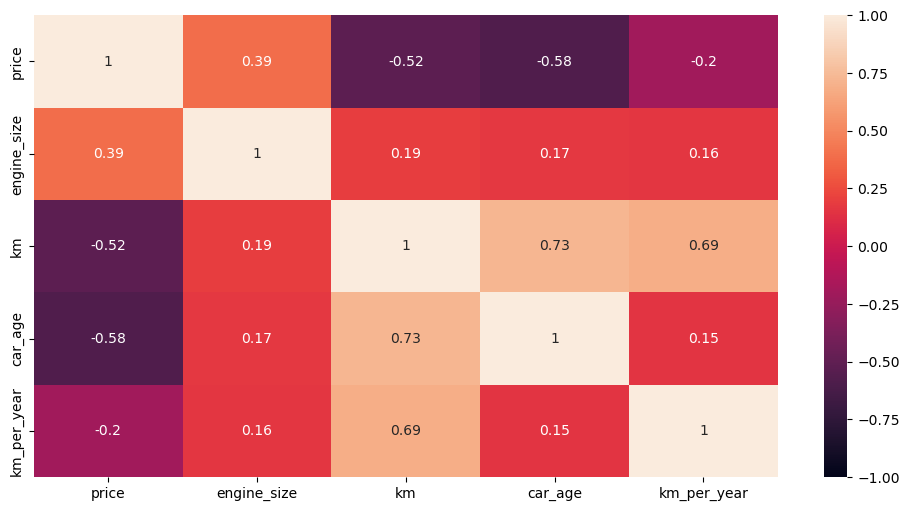

In [56]:
# visualize correlation heatmap
sns.heatmap(o_cars.corr(numeric_only=True),vmin = -1,vmax = 1,annot = True)
plt.show()

#### Price vs Car age

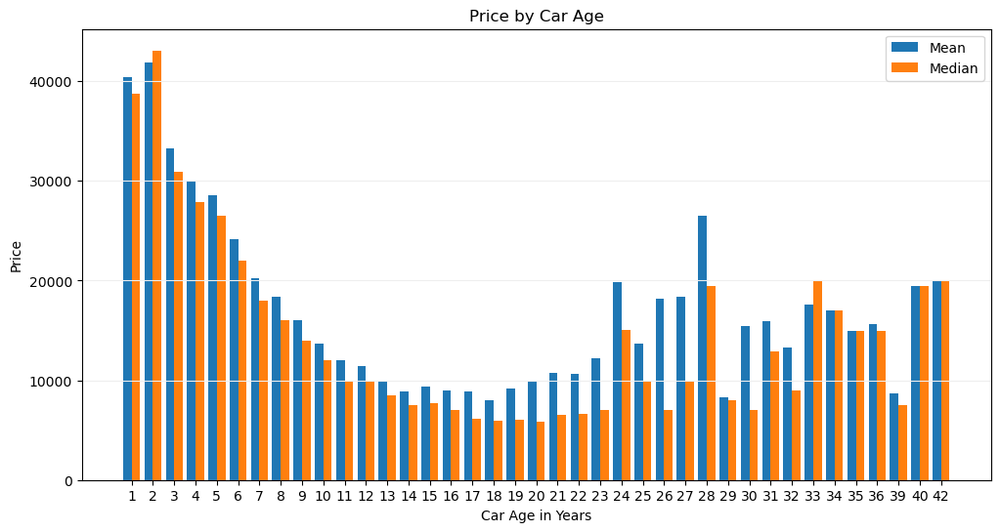

In [58]:
# group by car age & aggregate price info
ages = o_cars.groupby('car_age')['price'].agg([len, 'min', 'max', 'mean', 'median'])

# visualize price vs car age
fig, ax = plt.subplots()
x = np.arange(len(ages))
w = 0.4

b1 = ax.bar(x, ages['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, ages['median'], width=w, label='Median')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(ages.index)
ax.legend()
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Car Age in Years')
ax.set_ylabel('Price')
ax.set_title('Price by Car Age')

plt.show()

#### Price vs Km

Text(0.5, 1.0, 'Price vs Km')

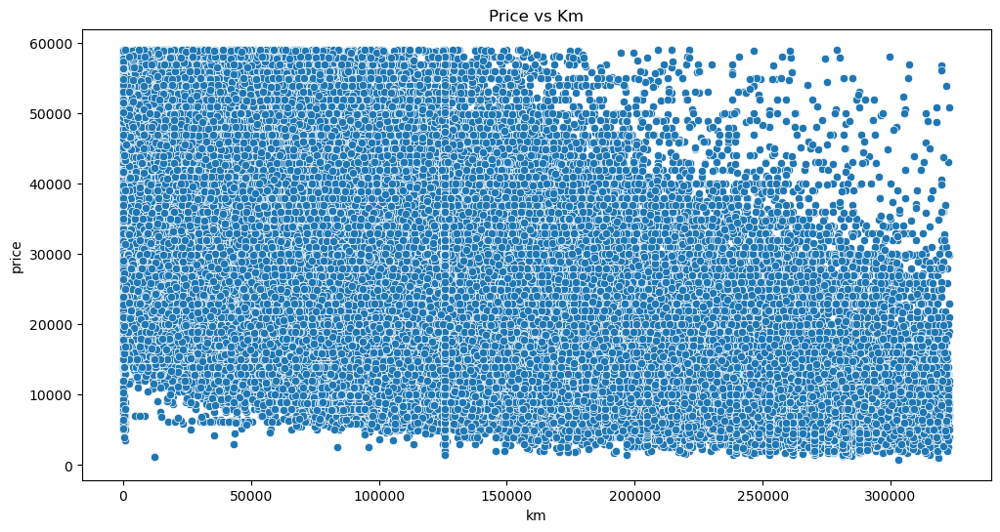

In [60]:
# with seaborn library
fig, axes = plt.subplots(1, figsize=(12, 6))

sns.scatterplot(data=o_cars, x='km', y='price', ax=axes)
axes.set_title('Price vs Km')

#### Price vs Make

50


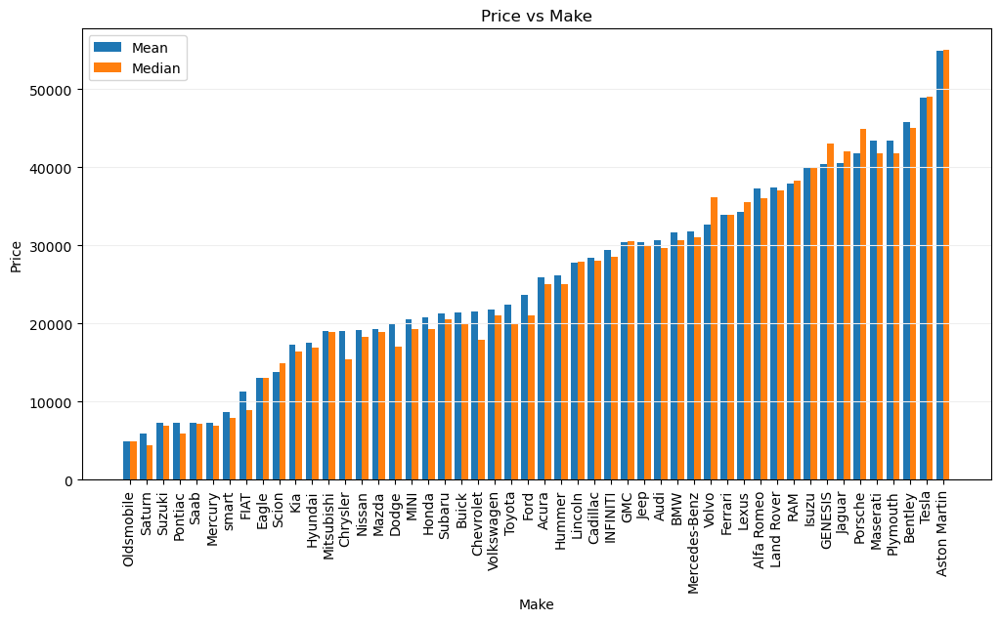

In [62]:
# group by make & aggregate price info
makes = o_cars.groupby('make')['price'].agg([len, 'min', 'max', 'mean', 'median']).sort_values('mean')
print(len(makes))

# visualize price vs make
fig, ax = plt.subplots()
x = np.arange(len(makes))
w = 0.4

b1 = ax.bar(x, makes['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, makes['median'], width=w, label='Median')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(makes.index)
ax.legend(loc='upper left')
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Make')
ax.set_ylabel('Price')
ax.set_title('Price vs Make')

plt.xticks(rotation=90)
plt.show()

##### Encode make based on price -- Heirarchical/label-based

              len      min      max     mean   median
make                                                 
Aston Martin    7  49999.0  57990.0  54974.0  54995.0


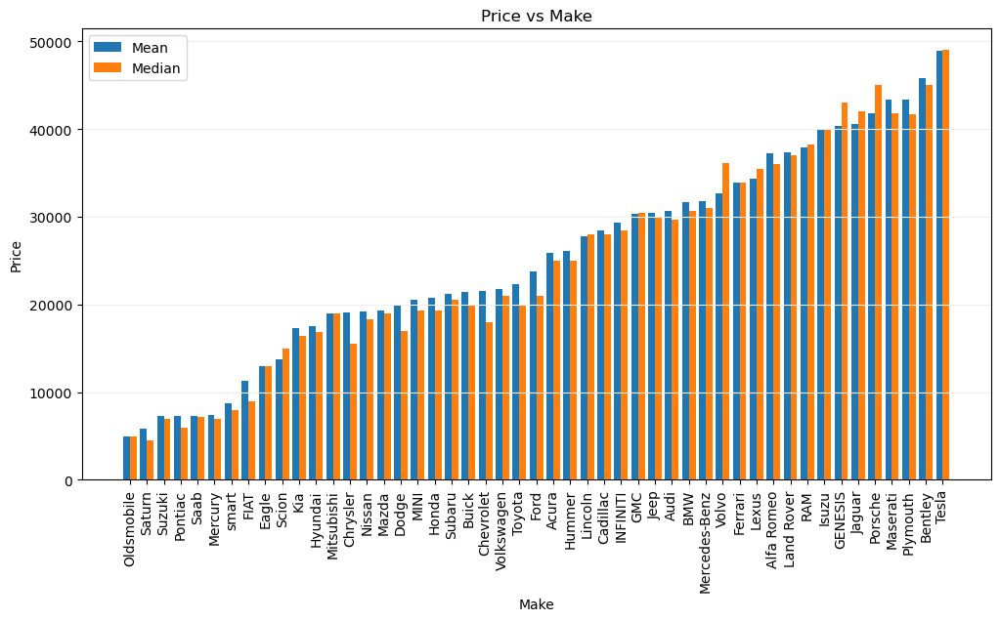

In [64]:
# tier 1 -- luxury -- avg price > $50,000
makes[(makes['mean']>50000)|(makes['median']>50000)]
lux = (makes['mean']>50000)|(makes['median']>50000) # create mask 
print(makes[lux]) 

# create new df w / 'luxury' level makes removed
makes2 = makes[~lux]

# visualize price vs make
fig, ax = plt.subplots()
x = np.arange(len(makes2))
w = 0.4

b1 = ax.bar(x, makes2['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, makes2['median'], width=w, label='Median')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(makes2.index)
ax.legend(loc='upper left')
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Make')
ax.set_ylabel('Price')
ax.set_title('Price vs Make')

plt.xticks(rotation=90)
plt.show()

                len      min      max          mean   median
make                                                        
Ferrari           1  33900.0  33900.0  33900.000000  33900.0
Isuzu             1  39995.0  39995.0  39995.000000  39995.0
Plymouth         10  37990.0  54000.0  43385.800000  41747.5
Bentley          11  35800.0  57950.0  45829.090909  44998.0
Maserati         59  18990.0  58995.0  43373.050847  41800.0
GENESIS         102   5698.0  58999.0  40375.431373  42998.0
Alfa Romeo      113  26880.0  58990.0  37264.858407  35995.0
Tesla           114  32888.0  58999.0  48982.596491  48995.0
Porsche         386   3999.0  58995.0  41795.515544  44990.0
Jaguar          654   4900.0  58995.0  40571.181957  41995.0
Volvo           869   1990.0  58999.0  32659.863061  36154.0
Land Rover      898   3200.0  58995.0  37389.963252  36995.0
Lexus          2515   1995.0  58999.0  34307.782903  35500.0
Audi           3773   1231.0  58995.0  30621.653061  29695.0
GMC            4677   34

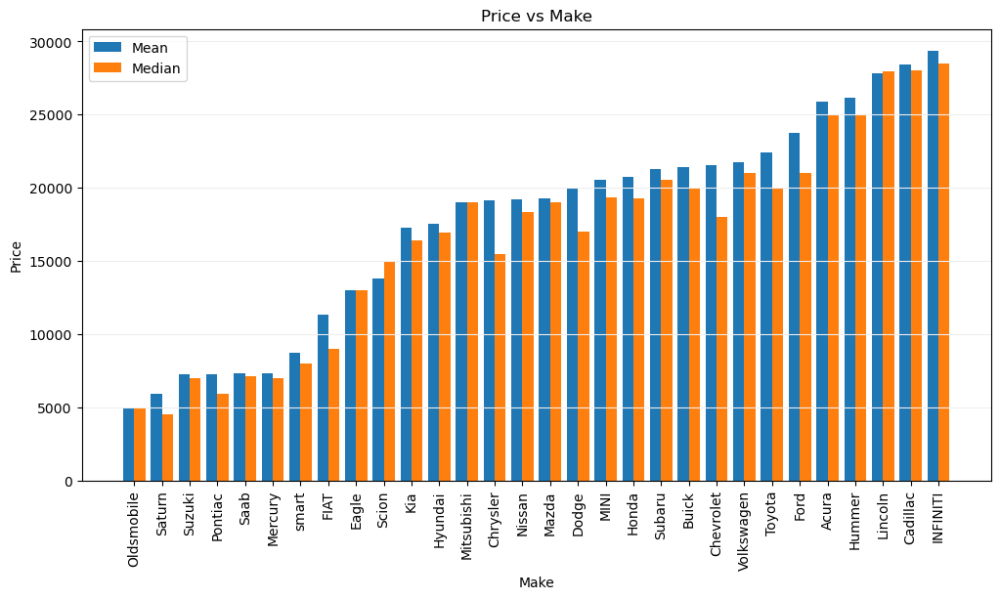

In [65]:
# tier 2 -- premium -- avg price $30,001-$50,000 -- assign int 2
makes2[((makes2['mean']>30000)&(makes2['mean']<=50000))|((makes2['median']>30000)&(makes2['median']<=50000))]
prem = ((makes2['mean']>30000)&(makes2['mean']<=50000))|((makes2['median']>30000)&(makes2['median']<=50000))
print(makes2[prem].sort_values('len'))

# create new df w / 'premium' level makes removed
makes3 = makes2[~prem]

# visualize price vs make
fig, ax = plt.subplots()
x = np.arange(len(makes3))
w = 0.4

b1 = ax.bar(x, makes3['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, makes3['median'], width=w, label='Median')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(makes3.index)
ax.legend(loc='upper left')
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Make')
ax.set_ylabel('Price')
ax.set_title('Price vs Make')

plt.xticks(rotation=90)
plt.show()

In [66]:
# tier 3 -- mainstream -- avg price $15,001-$30,000 -- assign int 1
makes3[((makes3['mean']>15000)&(makes3['mean']<=30000))|((makes3['median']>15000)&(makes3['median']<=30000))]
main = ((makes3['mean']>15000)&(makes3['mean']<=30000))|((makes3['median']>15000)&(makes3['median']<=30000))
print(makes3[main])

# tier 4 -- economy / basic -- avg price <= $15,000 -- assign int 0
econ = makes3[~main] # create new df w / only 'economy' level makes remaining
econ

              len     min      max          mean   median
make                                                     
Kia          9645  1500.0  58990.0  17260.013167  16380.0
Hyundai     12946  1700.0  58679.0  17521.515294  16900.0
Mitsubishi   2278  1995.0  49995.0  19011.852502  18990.5
Chrysler     2001  1495.0  58795.0  19107.693653  15495.0
Nissan      13396  1295.0  57950.0  19200.670648  18340.0
Mazda        7493   800.0  53745.0  19268.203390  18984.0
Dodge        8185  1498.0  58999.0  19924.131704  16995.0
MINI         1148  2995.0  54005.0  20561.899826  19343.0
Honda       15350  1695.0  58892.0  20748.784169  19300.0
Subaru       3632  1800.0  53470.0  21248.957048  20525.0
Buick        2333  1900.0  58153.0  21379.801543  19995.0
Chevrolet   13619  1100.0  59000.0  21514.996035  17990.0
Volkswagen   8068  1799.0  59000.0  21756.997769  20995.0
Toyota      15041  1900.0  58998.0  22374.260687  19998.0
Ford        18261  1500.0  59001.0  23723.102678  20998.0
Acura        2

,len,min,max,mean,median
make,,,,,
Oldsmobile,2,4995.0,4995.0,4995.000000,4995.0
Saturn,65,1488.0,18995.0,5895.692308,4495.0
Suzuki,76,2450.0,14995.0,7253.657895,6995.0
Pontiac,217,1300.0,40850.0,7281.658986,5900.0
Saab,8,2977.0,12750.0,7310.500000,7147.5
Mercury,6,2850.0,12888.0,7349.666667,6987.5
smart,197,3000.0,23997.0,8704.527919,7987.0
FIAT,385,2695.0,41684.0,11293.348052,8995.0
Eagle,1,12998.0,12998.0,12998.000000,12998.0


In [67]:
# create copy of dataframe for encoding categorical variables
e_cars = o_cars.copy()

# create lists of each tier of makes
lux_makes = list(makes[lux].index)
prem_makes = list(makes2[prem].index)
main_makes = list(makes3[main].index)
econ_makes = list(econ.index)

# create list of conditions
cond = [
    (e_cars['make'].isin(lux_makes)),
    (e_cars['make'].isin(prem_makes)),
    (e_cars['make'].isin(main_makes)),
    (e_cars['make'].isin(econ_makes))
]
# create list of values to assign for each condition
labels = ['luxury','premium','mainstream','economy']
tiers = [3,2,1,0]

# engineer column for 'make tier' with integer values as above
e_cars['make_tier'] = np.select(cond, labels)
e_cars['make_tier_int'] = np.select(cond, tiers)

e_cars.head()

,vin,price,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block,province,km,car_age,km_per_year,make_tier,make_tier_int
id,,,,,,,,,,,,,,,,,,,
e7182540-862d,19UDE2F30HA801177,17480.0,2017,Acura,ILX,ILX,Sedan,Car,FWD,Automatic,Gas,2.4,I,NS,125923.739451,6,20987.29,mainstream,1
616b4be5-090b,19UDE2F30JA800794,19999.0,2018,Acura,ILX,ILX,Sedan,Car,FWD,Automatic,Gas,2.4,I,ON,62400.000000,5,12480.0,mainstream,1
b59cb8d2-737d,19UDE2F31HA801835,19888.0,2017,Acura,ILX,ILX,Sedan,Car,FWD,Automatic,Gas,2.4,I,AB,108323.200000,6,18053.87,mainstream,1
08f1d430-3431,19UDE2F32GA800773,15988.0,2016,Acura,ILX,ILX,Sedan,Car,FWD,Automatic,Gas,2.4,I,ON,142400.000000,7,20342.86,mainstream,1
989c51b1-9af5,19UDE2F32HA801892,15500.0,2017,Acura,ILX,ILX,Sedan,Car,FWD,Automatic,Gas,2.4,I,ON,80460.800000,6,13410.13,mainstream,1


##### Encode make -- normalize 0-1 scale

In [69]:
# normalize mean price
n_means = (makes['mean'] - makes['mean'].min()) / (makes['mean'].max() - makes['mean'].min())
n_means

# map back to o_cars dataframe
e_cars['make_scale'] = e_cars['make'].map(n_means)

#### Price vs Engine size

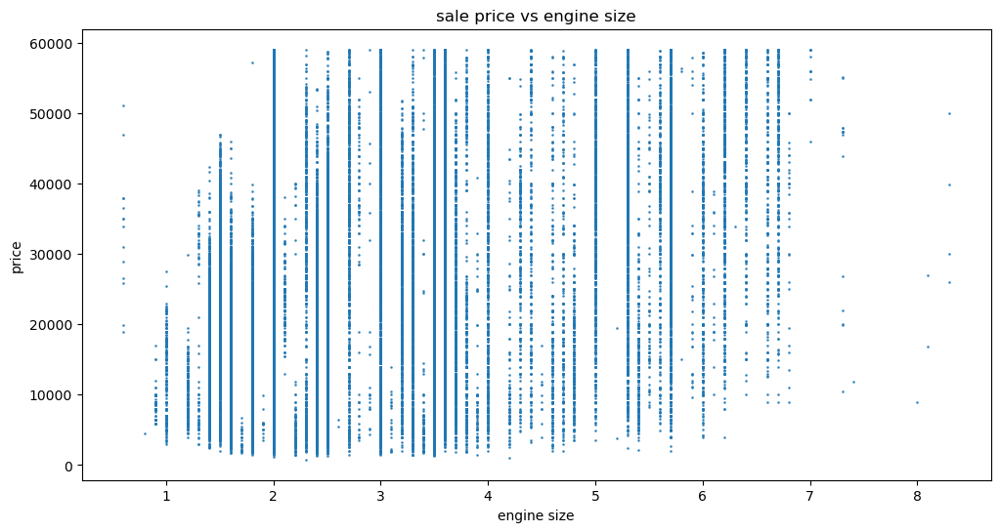

In [71]:
# visualize price vs engine size
plt.figure()
plt.scatter(e_cars['engine_size'], e_cars['price'],
           s=0.8, alpha=0.8)
plt.xlabel('engine size')
plt.ylabel('price')
plt.title('sale price vs engine size')
plt.show()

#### Price vs Vehicle type

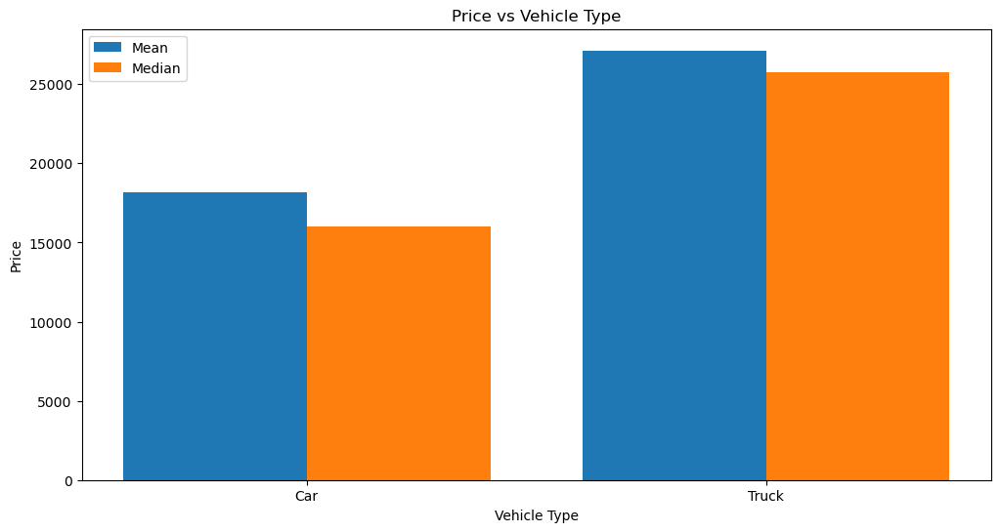

In [73]:
# group by vehicle type & aggregate price info
types = e_cars.groupby('vehicle_type', observed=True)['price'].agg([len, 'min', 'max', 'mean', 'median'])

# visualize price vs vehicle type
fig, ax = plt.subplots()
x = np.arange(len(types))
w = 0.4

# b3 = ax.bar(x, types['min'], width=w, label='Minimum')
# b1 = ax.bar(x + w, types['mean'], width=w, label='Mean')
b1 = ax.bar(x, types['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, types['median'], width=w, label='Median')
# b2 = ax.bar(x + (2*w), types['median'], width=w, label='Median')
# b4 = ax.bar(x + (3*w), types['max'], width=w, label='Maximum')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(types.index)
ax.legend(loc='upper left')
# ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Vehicle Type')
ax.set_ylabel('Price')
ax.set_title('Price vs Vehicle Type')

plt.show()

In [74]:
# create list of conditions
vtc = [
    (e_cars['vehicle_type']=='Car'),
    (e_cars['vehicle_type']=='Truck'),
    (e_cars['vehicle_type'].isna())
]
# create list of values (integers) to assign for each condition
vtv = [0,1,np.NaN]

# encode -- 'Car' == 0, 'Truck' == 1
e_cars['vt_coded'] = np.select(vtc, vtv)

print(e_cars['vehicle_type'].value_counts())
print(e_cars['vt_coded'].value_counts())

vehicle_type
Truck    99678
Car      68372
Name: count, dtype: int64
vt_coded
1.0    99678
0.0    68372
Name: count, dtype: int64


#### Price vs Transmission type

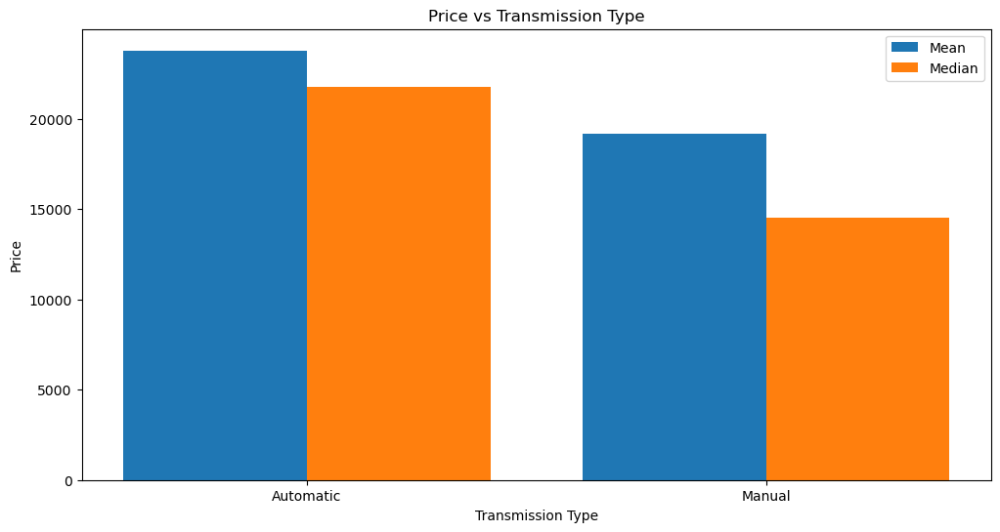

In [76]:
# group by transmission type & aggregate price info
trans = e_cars.groupby('transmission', observed=True)['price'].agg([len, 'min', 'max', 'mean', 'median'])

# visualize price vs transmission
fig, ax = plt.subplots()
x = np.arange(len(trans))
w = 0.4

# b3 = ax.bar(x, trans['min'], width=w, label='Minimum')
# b1 = ax.bar(x + w, trans['mean'], width=w, label='Mean')
b1 = ax.bar(x, trans['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, trans['median'], width=w, label='Median')
# b2 = ax.bar(x + (2*w), trans['median'], width=w, label='Median')
# b4 = ax.bar(x + (3*w), trans['max'], width=w, label='Maximum')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(trans.index)
ax.legend()
# ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Transmission Type')
ax.set_ylabel('Price')
ax.set_title('Price vs Transmission Type')

plt.show()

In [77]:
# create list of conditions
ttc = [
    (e_cars['transmission']=='Manual'),
    (e_cars['transmission']=='Automatic'),
    (e_cars['transmission'].isna())
]
# create list of values to assign for each condition
ttv = [0,1,np.NaN]

# encode -- 'Manual' == 0, 'Automatic' == 1
e_cars['trans_coded'] = np.select(ttc, ttv)

print(e_cars['transmission'].value_counts())
print(e_cars['trans_coded'].value_counts())

transmission
Automatic    164727
Manual        14664
Name: count, dtype: int64
trans_coded
1.0    164727
0.0     14664
Name: count, dtype: int64


#### Price vs Fuel type

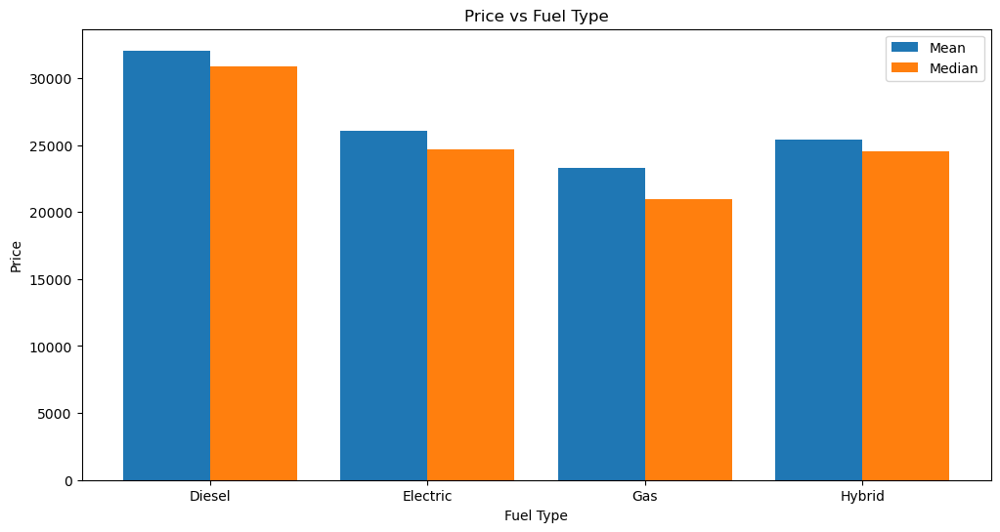

In [79]:
# group by fuel type & aggregate price info
fuel = e_cars.groupby('fuel_type', observed=True)['price'].agg([len, 'min', 'max', 'mean', 'median'])

# visualize price vs fuel type
fig, ax = plt.subplots()
x = np.arange(len(fuel))
w = 0.4

# b3 = ax.bar(x, fuel['min'], width=w, label='Minimum')
# b1 = ax.bar(x + w, fuel['mean'], width=w, label='Mean')
b1 = ax.bar(x, fuel['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, fuel['median'], width=w, label='Median')
# b2 = ax.bar(x + (2*w), fuel['median'], width=w, label='Median')
# b4 = ax.bar(x + (3*w), fuel['max'], width=w, label='Maximum')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(fuel.index)
ax.legend()
# ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Fuel Type')
ax.set_ylabel('Price')
ax.set_title('Price vs Fuel Type')

plt.show()

In [80]:
# create list of conditions
ftc = [
    (e_cars['fuel_type']=='Gas'),
    (e_cars['fuel_type']=='Hybrid'),
    (e_cars['fuel_type']=='Electric'),
    (e_cars['fuel_type']=='Diesel'),
    (e_cars['fuel_type'].isna())
]
# create list of values to assign for each condition
ftv = [0,1,2,3,np.NaN]

# encode 
e_cars['ft_coded'] = np.select(ftc, ftv)

print(e_cars['fuel_type'].value_counts())
print(e_cars['ft_coded'].value_counts())

fuel_type
Gas         159641
Hybrid        3837
Diesel        2841
Electric      1157
Name: count, dtype: int64
ft_coded
0.0    159641
1.0      3837
3.0      2841
2.0      1157
Name: count, dtype: int64


#### Price vs Body type

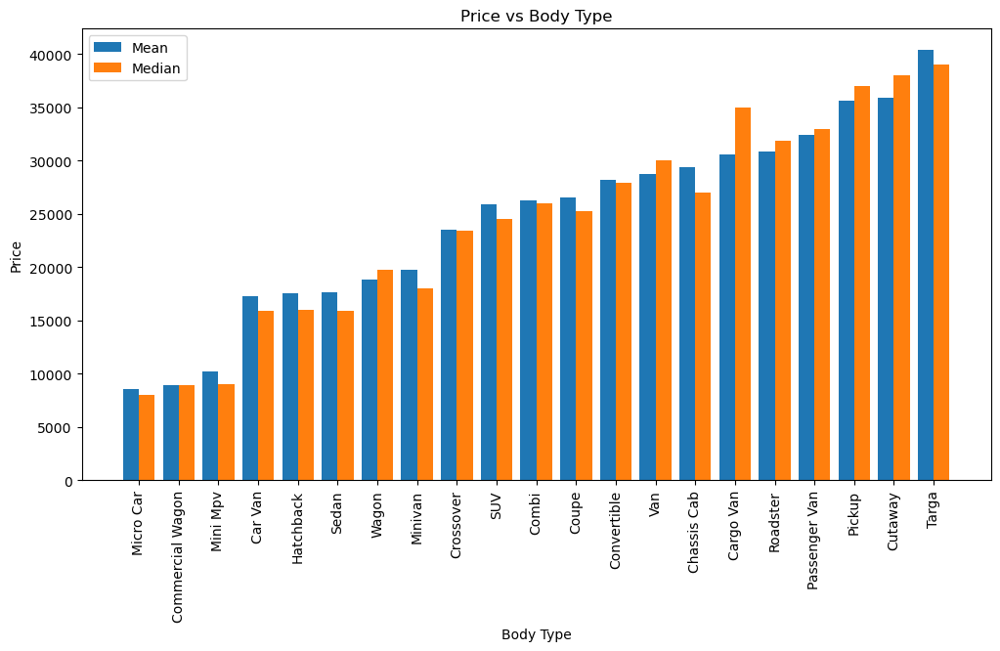

In [82]:
# group by body type & aggregate price info
body = e_cars.groupby('body_type', observed=True)['price'].agg([len, 'min', 'max', 'mean', 'median']).sort_values('mean')

# visualize price vs fuel type
fig, ax = plt.subplots()
x = np.arange(len(body))
w = 0.4

# b3 = ax.bar(x, body['min'], width=w, label='Minimum')
# b1 = ax.bar(x + w, body['mean'], width=w, label='Mean')
b1 = ax.bar(x, body['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, body['median'], width=w, label='Median')
# b2 = ax.bar(x + (2*w), body['median'], width=w, label='Median')
# b4 = ax.bar(x + (3*w), body['max'], width=w, label='Maximum')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(body.index)
ax.legend(loc='upper left')
# ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Body Type')
ax.set_ylabel('Price')
ax.set_title('Price vs Body Type')

plt.xticks(rotation=90)
plt.show()

#### Price vs Province

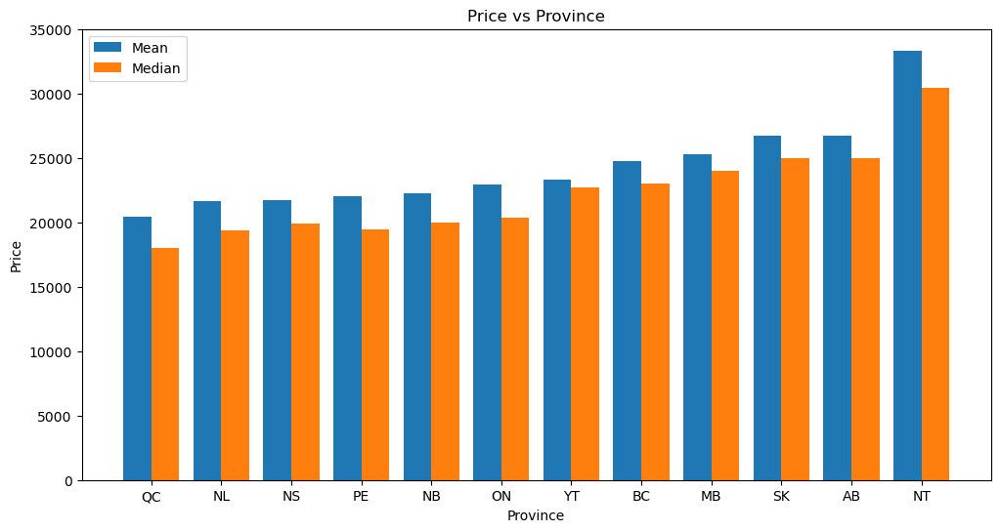

In [84]:
# group by province & aggregate price info
states = (e_cars['province']=='NC') | (e_cars['province']=='OH') | (e_cars['province']=='SC')
cdn = e_cars[~states].groupby('province', observed=True)['price'].agg([len, 'min', 'max', 'mean', 'median']).sort_values('mean')

# visualize price vs province
fig, ax = plt.subplots()
x = np.arange(len(cdn))
w = 0.4

# b3 = ax.bar(x, cdn['min'], width=w, label='Minimum')
# b1 = ax.bar(x + w, cdn['mean'], width=w, label='Mean')
b1 = ax.bar(x, cdn['mean'], width=w, label='Mean')
b2 = ax.bar(x + w, cdn['median'], width=w, label='Median')
# b2 = ax.bar(x + (2*w), cdn['median'], width=w, label='Median')
# b4 = ax.bar(x + (3*w), cdn['max'], width=w, label='Maximum')

ax.set_xticks(x + w / 2)
ax.set_xticklabels(cdn.index)
ax.legend()
# ax.yaxis.grid(True, color='#EEEEEE')
ax.set_xlabel('Province')
ax.set_ylabel('Price')
ax.set_title('Price vs Province')

plt.show()

#### Price vs km/year

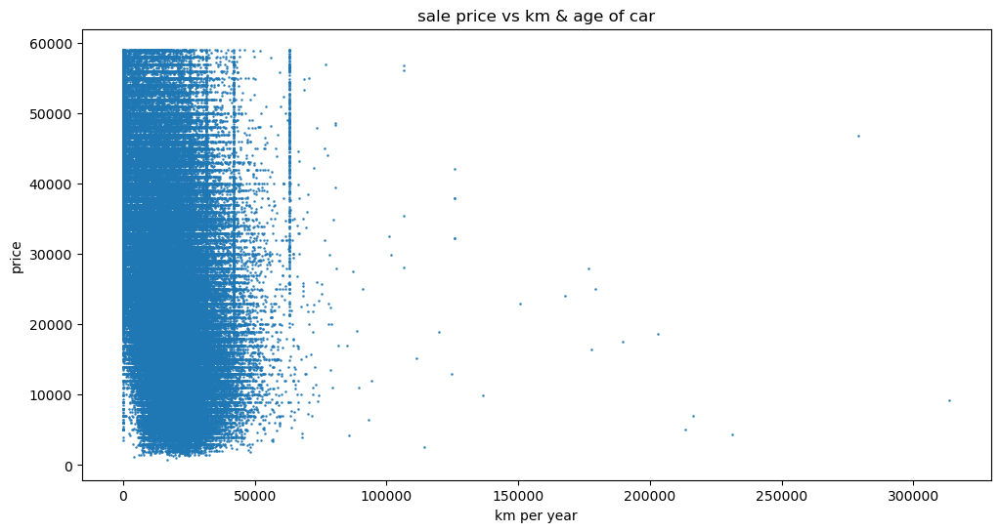

In [86]:
# visualize
plt.figure()
plt.scatter(e_cars['km_per_year'], e_cars['price'],
           s=0.8, alpha=0.8)
plt.xlabel('km per year')
plt.ylabel('price')
plt.title('sale price vs km & age of car')
plt.show()

---

# Modelling & Validation

In [88]:
e_cars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 179761 entries, e7182540-862d to 166a42fe-eb64
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   vin            179761 non-null  string  
 1   price          179761 non-null  float64 
 2   year           179761 non-null  string  
 3   make           179761 non-null  string  
 4   model          179648 non-null  string  
 5   trim           179728 non-null  string  
 6   body_type      170094 non-null  category
 7   vehicle_type   168050 non-null  category
 8   drivetrain     179338 non-null  category
 9   transmission   179391 non-null  category
 10  fuel_type      167476 non-null  category
 11  engine_size    166639 non-null  float64 
 12  engine_block   166366 non-null  category
 13  province       178282 non-null  category
 14  km             179761 non-null  float64 
 15  car_age        179761 non-null  Int64   
 16  km_per_year    179761 non-null  Float64 
 

In [89]:
# convert remaining string-categorical columns to category dtype
e_cars[['make','model','trim','make_tier']] = e_cars[['make','model','trim','make_tier']].astype('category')
e_cars['car_age'] = e_cars['car_age'].astype('int')
e_cars['km_per_year'] = e_cars['km_per_year'].astype('float')

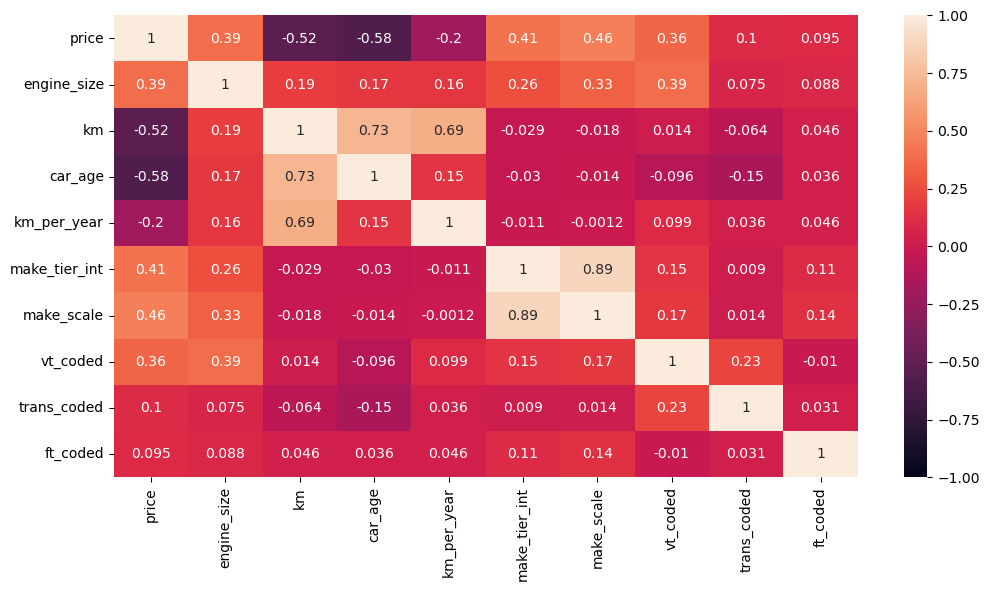

In [90]:
# re-view correlations between numerical columns
e_cars.corr(numeric_only=True)

# visualize correlation heatmap
sns.heatmap(e_cars.corr(numeric_only=True),vmin = -1,vmax = 1,annot = True)
plt.show()

In [91]:
## helper functions for modelling & evaluation
# calculate evaluation metrics 
def evaluate_model(y_true, y_pred, set_name=''):
    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)

    print(f"\n{set_name} Set Metrics:")
    print(f"R2 Score: {r2:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Mean Absolute Error: {mae:.4f}")

# plot regression model
def plot_regression(model, y_true, y_pred):
    residuals = y_true - y_pred

    fig, axes = plt.subplots(2,2)

    # residuals vs fitted
    axes[0,0].scatter(y_pred, residuals, alpha=0.5)
    axes[0,0].axhline(y=0, color='r', linestyle='--')
    axes[0,0].set_xlabel('Fitted Residuals')
    axes[0,0].set_ylabel('Residuals')
    axes[0,0].set_title('Residuals vs Fitted')

    # Q-Q plot
    stats.probplot(residuals, dist='norm', plot=axes[0,1])
    axes[0,1].set_title('Normal Q-Q Plot')
        
    # Histogram of residuals
    axes[1, 0].hist(residuals, bins=30, edgecolor='black')
    axes[1, 0].set_xlabel('Residuals')
    axes[1, 0].set_ylabel('Count')
    axes[1, 0].set_title('Histogram of Residuals')
    
    # Actual vs Predicted
    axes[1, 1].scatter(y_true, y_pred, alpha=0.5)
    axes[1, 1].plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--')
    axes[1, 1].set_xlabel('Actual Values')
    axes[1, 1].set_ylabel('Predicted Values')
    axes[1, 1].set_title('Actual vs Predicted')
    
    plt.tight_layout()
    plt.show()

In [92]:
# split the data
ecars2 = e_cars.dropna()
train, test = train_test_split(ecars2, test_size=0.2, random_state=42)


Training Set Metrics:
R2 Score: 0.7084
Root Mean Squared Error: 6629.1667
Mean Absolute Error: 5057.4153

Test Set Metrics:
R2 Score: 0.7082
Root Mean Squared Error: 6602.6582
Mean Absolute Error: 5039.4242


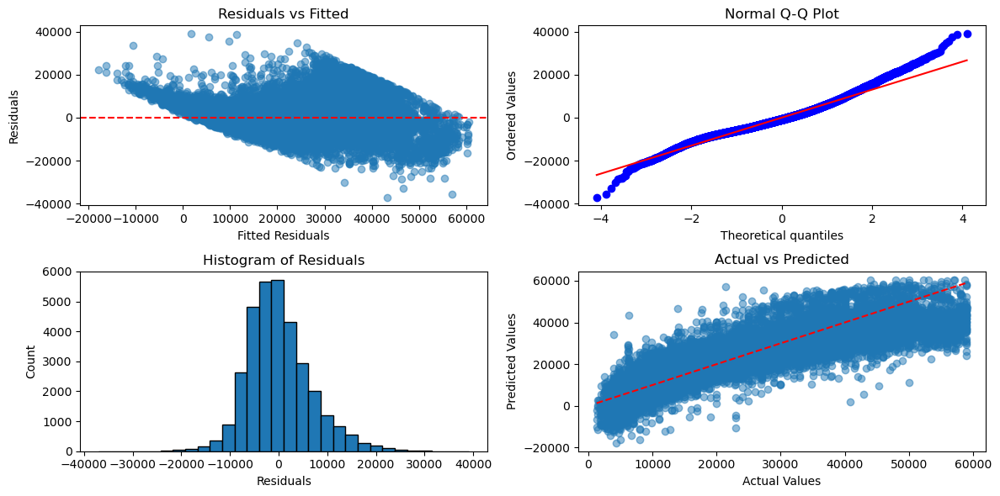


Model Summary:
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    1.564e+04     76.350    204.866      0.000    1.55e+04    1.58e+04
make_scale   3.479e+04    172.470    201.732      0.000    3.45e+04    3.51e+04
engine_size  4427.3058     17.470    253.421      0.000    4393.065    4461.547
km             -0.0426      0.000   -119.208      0.000      -0.043      -0.042
car_age     -1736.5551      8.277   -209.793      0.000   -1752.779   -1720.331


In [93]:
# fit the model on training data -- numerical
lrn = smf.ols('price ~ make_scale + engine_size + km + car_age', data=train).fit()

# make predictions on both training & test sets
train_pred = lrn.predict(train)
test_pred = lrn.predict(test)

# evaluate on training set
evaluate_model(train['price'], train_pred, "Training")
# evaluate on test set
evaluate_model(test['price'], test_pred, "Test")
# diagnostic plots
plot_regression(lrn, test['price'], test_pred)

# print model summary
print("\nModel Summary:")
print(lrn.summary().tables[1])

## Observations
R2 Score:
Training Set: 0.7071
Test Set: 0.7059
The R2 score indicates that approximately 70.7% of the variance in the price can be explained by your model.
The similarity between the training and test set scores suggests that your model is not overfitting.

Root Mean Squared Error (RMSE):
Training Set: 6642.8525
Test Set: 6628.9655
The RMSE represents the standard deviation of the residuals (prediction errors). In this case, on average, our model's predictions deviate from the actual prices by about $6,630. 

Mean Absolute Error (MAE):
Training Set: 5079.3501
Test Set: 5071.3876
The MAE represents the average absolute difference between predicted and actual prices. Our model's predictions are off by an average of about $5,075.
ice.

## Model Summary
make_scale: Has the largest coefficient, suggesting it has the strongest impact on price. 
A one-unit increase in make_scale is associated with a $34,790 increase in price, on average.

engine_size: For each unit increase in engine size, the price increases by $4,427.3.17, on average.

km: For each additional kilometer, the price decreases by $0.0426, on average.

car_age: For each year of age, the price increases by $1736.02, on average.

All variables are statistically significant (p < 0.05), indicating they all contribute meaningfully to predicting the price.


Training Set Metrics:
R2 Score: 0.8086
Root Mean Squared Error: 5370.3164
Mean Absolute Error: 4011.4767

Test Set Metrics:
R2 Score: 0.8087
Root Mean Squared Error: 5346.4964
Mean Absolute Error: 3992.7137


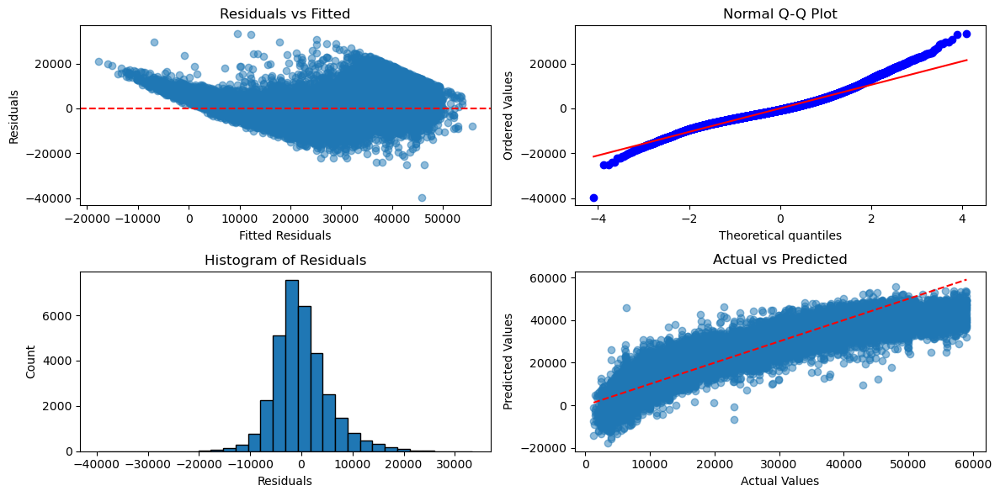

In [96]:
# fit the model on training data
mlr = smf.ols('price ~ engine_size + km + car_age + C(make) + C(body_type) + C(drivetrain) + C(engine_block) + C(province)', 
    data=ecars2).fit()

# make predictions
tr_pred = mlr.predict(train)
t_pred = mlr.predict(test)

# evaluate on training set
evaluate_model(train['price'], tr_pred, "Training")
# evaluate on test set
evaluate_model(test['price'], t_pred, "Test")
# diagnostic plots
plot_regression(mlr, test['price'], t_pred)

# print model summary
# print("\nModel Summary:")
# print(mlr.summary().tables[1])

## Key differences:
R2 Score:
Increased from about 0.71 to 0.80
This means the new model explains about 80% of the variance in price, up from 71%
It's a significant improvement in predictions

RMSE (Root Mean Squared Error):
Decreased from about 6630 to 5430
This indicates that the average prediction error has reduced by about $1200

MAE (Mean Absolute Error):
Decreased from about 5075 to 4120
This shows that the average absolute prediction error has reduced by about $955

Consistency between training and test sets:
Both models show similar performance on training and test sets
This suggests that neither model is overfitting